In [ ]:
pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 8.8 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder,LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import MinMaxScaler,StandardScaler,RobustScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score
from catboost import CatBoostClassifier

In [ ]:
train_data=pd.read_csv('/content/train (1).csv')
test_data=pd.read_csv('/content/test.csv')
print(train_data.shape)
print(test_data.shape)

(594194, 21)
(254655, 20)


In [ ]:
print("train_data Null values :",train_data.isnull().sum())
print("test_data Null values",test_data.isnull().sum())
train_data.apply(lambda x: (x == ' ').sum())

train_data Null values : id                  0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64
test_data Null values id                  0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
dtype: int64


,0
id,0
gender,0
SeniorCitizen,0
Partner,0
Dependents,0
tenure,0
PhoneService,0
MultipleLines,0
InternetService,0
OnlineSecurity,0


In [ ]:
print(train_data.columns)
print(test_data.columns)
print(train_data.info())
print(train_data.describe())

Index(['id', 'gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')
Index(['id', 'gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 594194 entries, 0 to 594193
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                594194 non-null  int64  
 1   gen

In [ ]:
train_data

,id,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,Male,0,Yes,Yes,29,Yes,No,DSL,Yes,...,Yes,Yes,No,No,One year,Yes,Mailed check,60.10,1653.85,No
1,1,Male,0,Yes,Yes,58,Yes,No,DSL,Yes,...,No,Yes,Yes,No,Two year,No,Credit card (automatic),69.50,3778.20,No
2,2,Male,0,Yes,No,58,Yes,Yes,Fiber optic,No,...,No,No,Yes,Yes,Month-to-month,Yes,Electronic check,100.40,5841.35,No
3,3,Female,0,No,No,1,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,69.70,70.70,Yes
4,4,Female,0,No,No,1,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.45,70.45,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594189,594189,Male,0,No,No,57,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Two year,No,Bank transfer (automatic),97.55,5460.70,No
594190,594190,Female,0,No,No,72,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,Two year,No,Bank transfer (automatic),91.95,6782.15,No
594191,594191,Female,0,Yes,No,72,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Credit card (automatic),24.40,1871.90,No
594192,594192,Female,0,No,No,32,Yes,Yes,Fiber optic,No,...,No,No,No,Yes,Month-to-month,Yes,Electronic check,86.00,2847.20,No


In [ ]:
from scipy.sparse.linalg._eigen import test
'''
In the dataset there 21 cloumns:
id,gender,senior citizen,partner,Dependents,tenure,Phone service,multipleLines,InternetService,
OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,STreamingTV,StreamingMovies,Contract,paperlessbillind,
PaymentMethod,MonthlyCharges,TotalCharges,Churn

These are the columns in the datasets
1.Check the null values ->there is no null values in the dataset
2.convert the churn object  into integer
3.drop the column of id ->It isnot required for the model training if give the model it will confuses the model training
4.check for outliers in the dataset

'''
train_data.drop('id',axis=1,inplace=True)
test_data_id=test_data['id']
test_data.drop('id',axis=1,inplace=True)
train_data['Churn']=train_data['Churn'].replace({'Yes':1,'No':0})
print(train_data.isnull().sum())

gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64


In [ ]:
train_data
'''
Feature creation:
In the dataset there is lot features to create in our datset it's helpful for the model performance.
1.Average Monthly Spend:Detect customers paying unusually high or low amounts.
2.Tenure Grouping (Customer Loyalty Level):Tenure Grouping (Customer Loyalty Level).
we understand new member leave to another firm or existing customers.
But One Important Question

Before creating features, ask:

 Are you using tree-based model or linear model?

If using:

Random Forest

XGBoost

They automatically capture interactions. Feature creation helps less.

If using:

Logistic Regression

Feature engineering helps a LOT.
'''

"\nFeature creation:\nIn the dataset there is lot features to create in our datset it's helpful for the model performance.\n1.Average Monthly Spend:Detect customers paying unusually high or low amounts.\n2.Tenure Grouping (Customer Loyalty Level):Tenure Grouping (Customer Loyalty Level).\nwe understand new member leave to another firm or existing customers.\nBut One Important Question\n\nBefore creating features, ask:\n\n Are you using tree-based model or linear model?\n\nIf using:\n\nRandom Forest\n\nXGBoost\n\nThey automatically capture interactions. Feature creation helps less.\n\nIf using:\n\nLogistic Regression\n\nFeature engineering helps a LOT.\n"

In [ ]:
'''
EDA:
1.calcualte how many males and feamles are churn or not churn
2.Senior citizen how many are churn or not
3.Contract based in whic  categories or churn or not
'''

In [ ]:
g_labels=['Male','Female']
c_labels=['Yes','No']
fig=make_subplots(rows=1,cols=2,specs=[[{'type':'domain'}, {'type':'domain'}]])
g_labels = ['Male', 'Female']
c_labels = ['No', 'Yes']
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=g_labels, values=train_data['gender'].value_counts(), name="Gender"),
              1, 1)
fig.add_trace(go.Pie(labels=c_labels, values=train_data['Churn'].value_counts(), name="Churn"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Gender and Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Gender', x=0.16, y=0.5, font_size=20, showarrow=False),
                 dict(text='Churn', x=0.84, y=0.5, font_size=20, showarrow=False)])
fig.show()
'''
22.5% people swap into another stream.
'''

In [ ]:
train_data["Churn"][train_data["Churn"]==1].groupby(by=train_data["gender"]).count()

,Churn
gender,
Female,68123
Male,65694


In [ ]:
train_data["Churn"][train_data["Churn"]==0].groupby(by=train_data["gender"]).count()

,Churn
gender,
Female,230615
Male,229762


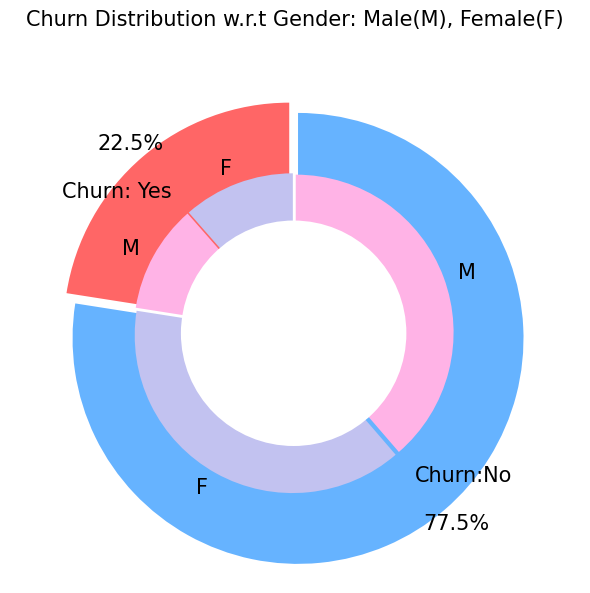

'\nThere is negligible difference in customer percentage/ count who changed the service provider.\n Both genders behaved in similar fashion when it comes to migrating to another service provider/firm.\n'

In [ ]:
plt.figure(figsize=(6, 6))
labels =["Churn: Yes","Churn:No"]
values = [133817,460377]
labels_gender = ["F","M","F","M"]
sizes_gender = [68123,65694 , 230615,229762]
colors = ['#ff6666', '#66b3ff']
colors_gender = ['#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6']
explode = (0.3,0.3)
explode_gender = (0.1,0.1,0.1,0.1)
textprops = {"fontsize":15}
#Plot
plt.pie(values, labels=labels,autopct='%1.1f%%',pctdistance=1.08, labeldistance=0.8,colors=colors, startangle=90,frame=True, explode=explode,radius=10, textprops =textprops, counterclock = True, )
plt.pie(sizes_gender,labels=labels_gender,colors=colors_gender,startangle=90, explode=explode_gender,radius=7, textprops =textprops, counterclock = True, )
#Draw circle
centre_circle = plt.Circle((0,0),5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Churn Distribution w.r.t Gender: Male(M), Female(F)', fontsize=15, y=1.1)

# show plot

plt.axis('equal')
plt.tight_layout()
plt.show()

'''
There is negligible difference in customer percentage/ count who changed the service provider.
 Both genders behaved in similar fashion when it comes to migrating to another service provider/firm.
'''

In [ ]:
fig = px.histogram(train_data, x="Churn", color="Contract", barmode="group", title="<b>Customer contract distribution<b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()
'''
In the plot shows mainly month-to-month customers are churning.
'''

In [ ]:
labels = train_data['PaymentMethod'].unique()
values = train_data['PaymentMethod'].value_counts()

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_layout(title_text="<b>Payment Method Distribution</b>")
fig.show()

In [ ]:
fig = px.histogram(train_data, x="Churn", color="PaymentMethod", title="<b>Customer Payment Method distribution w.r.t. Churn</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()
'''
Major customers who moved out were having Electronic Check as Payment Method.
Customers who opted for Credit-Card automatic transfer or Bank Automatic Transfer and Mailed Check as Payment Method were less likely to move out.
'''

In [ ]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(train_data, x="Churn", color="Dependents", barmode="group", title="<b>Dependents distribution</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [ ]:
color_map = {"Yes": '#FFA15A', "No": '#00CC96'}
fig = px.histogram(train_data, x="Churn", color="Partner", barmode="group", title="<b>Chrun distribution w.r.t. Partners</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [ ]:
color_map = {"Yes": '#00CC96', "No": '#B6E880'}
fig = px.histogram(train_data, x="Churn", color="SeniorCitizen",barmode="group" ,title="<b>Chrun distribution w.r.t. Senior Citizen</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

In [ ]:
color_map = {"Yes": '#00CC96', "No": '#B6E880',"No internet service":"#B6E880"}
fig=px.histogram(train_data,x='Churn',color='OnlineSecurity',barmode='group',color_discrete_map=color_map,title='Churn Predictive vs Online Security')
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()
'''Most customers churn in the absence of online security,'''

In [ ]:
color_map = {"Yes": '#00CC96', "No": '#B6E880'}
fig=px.histogram(train_data,x='Churn',color='PaperlessBilling',barmode='group',color_discrete_map=color_map,title='Churn Predictive vs Online Security')
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()
'''
Customers with Paperless Billing are most likely to churn.
'''

'\nCustomers with Paperless Billing are most likely to churn.\n'

In [ ]:
fig = px.histogram(train_data, x="Churn", color="TechSupport",barmode="group",  title="<b>Chrun distribution w.r.t. TechSupport</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()
'''
Customers with no TechSupport are most likely to migrate to another service provider.
'''

'\nCustomers with no TechSupport are most likely to migrate to another service provider.\n'

In [ ]:
color_map = {"Yes": '#00CC96', "No": '#B6E880'}
fig = px.histogram(train_data, x="Churn", color="PhoneService", title="<b>Chrun distribution w.r.t. Phone Service</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()
'''Very small fraction of customers don't have a phone service and out of that, 1/3rd Customers are more likely to churn.'''

"Very small fraction of customers don't have a phone service and out of that, 1/3rd Customers are more likely to churn."

## Summary:

### Data Analysis Key Findings

The analysis identified several factors influencing customer churn, categorized by their impact:

*   **Strong Churn Predictors:**
    *   **Contract Type:** Approximately 75% of customers with Month-to-Month contracts churn, significantly higher than 13% for One Year and 3% for Two Year contracts.
    *   **Internet Service:** Customers with Fiber optic internet service exhibit a higher churn rate compared to those with DSL or no internet.
    *   **Online Security and Tech Support:** The absence of these services is a strong indicator of churn, with their presence reducing churn.
    *   **Payment Method:** `Electronic check` is a major payment method among churned customers, showing a moderate positive correlation with churn.
    *   **Paperless Billing:** Customers opting for `PaperlessBilling` are more likely to churn.
    *   **Tenure:** Shorter `tenure` (new customers) is strongly associated with a higher propensity to churn.
    *   **Monthly Charges:** Churned customers tend to have higher `MonthlyCharges`.

*   **Factors with Moderate/Lower Impact:**
    *   **Dependents and Partner:** Customers without `Dependents` or a `Partner` show a slightly higher churn rate.
    *   **Senior Citizen:** `SeniorCitizen` customers tend to have a higher churn rate.
    *   **Phone Service:** While the overall impact is low due to a small proportion of customers without it, those without `PhoneService` are more likely to churn.
    *   **Online Backup, Device Protection, Streaming TV, Streaming Movies:** Having these services can slightly reduce churn, though their impact is not as strong as Online Security or Tech Support.

*   **Factors with Negligible Impact:**
    *   **Gender:** There is no significant difference in churn rates between male and female customers.
    *   **MultipleLines:** This feature shows a very weak or negligible correlation with churn.

### Insights or Next Steps

*   **Prioritize Retention for Month-to-Month Contracts and Fiber Optic Users:** Focus retention efforts on customers with Month-to-Month contracts and those using Fiber optic internet, as these segments demonstrate the highest churn rates. Consider offering incentives for longer-term contracts or addressing potential service quality issues for Fiber optic.
*   **Enhance Value Proposition for Security and Support Services:** Actively promote and potentially bundle `OnlineSecurity` and `TechSupport` services, especially for new customers, given their strong negative correlation with churn.


In [ ]:
columns=['gender','Partner','Dependents','PhoneService','MultipleLines','MultipleLines','InternetService','OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','Contract','PaperlessBilling','PaymentMethod','Churn']
numerical=list(train_data.select_dtypes([np.number]).columns)
categorical=list(train_data.select_dtypes(object))
for col in categorical:
  print(train_data[col].value_counts())
  print('')

gender
Female    298738
Male      295456
Name: count, dtype: int64

Partner
Yes    309554
No     284640
Name: count, dtype: int64

Dependents
No     414362
Yes    179832
Name: count, dtype: int64

PhoneService
Yes    557893
No      36301
Name: count, dtype: int64

MultipleLines
No                  283384
Yes                 274509
No phone service     36301
Name: count, dtype: int64

InternetService
Fiber optic    272386
DSL            181081
No             140727
Name: count, dtype: int64

OnlineSecurity
No                     289474
Yes                    163993
No internet service    140727
Name: count, dtype: int64

OnlineBackup
No                     250083
Yes                    203384
No internet service    140727
Name: count, dtype: int64

DeviceProtection
No                     247377
Yes                    206090
No internet service    140727
Name: count, dtype: int64

TechSupport
No                     288571
Yes                    164896
No internet service    140727
Name: 

In [ ]:
'''There are so amny methods to convert the categorical values into numerical values.
In every method i will expalin what is it when we use
1.One Hot Encoding: column can categorical vales are seggreated into different columns .for example like male,female it converted into male_column,female_column
For example, if we encode:
Red = 1
Blue = 2
Green = 3
A model might think Green > Blue > Red, which is incorrect.
One-Hot Encoding avoids this false ordering.

when we use
1.When Categories Are Very High (High Cardinality) it mens like productId has 100000 unique values.
2.Order exists for example low,medium,high

2.Label Encoding:
It transforms the categorical values into numerical values.if categorical have a natural order ,then label Encoding is correct.
Example:
as per alphabetically sorted order (scikit-learn assigned Cold(0), Hot(1), "Very Hot" (2) and Warm (3)).


for example blue,green,white is not correctly .it affects the LinearRegression Logisticsregression ,SVM,NeuralNetworks for these use One-Hot Encoding


Ordinal Encoding
It transforms the categorical into numerical .It follows the alaphabetical order
Education LEvel
HighSchool->0
Bachelor->1
master->2
PhD->3

Helmert Encoding
It is mainly used for categorical variables that have order.It does something form One-Hot or Ordinal encoding.
It compares each category's mean of the target variable with the mean of other categories.
core Idea:
Is this category different from the average of previous categories.
there is  two types of Helmert coding:
Each level is compered with the mean levels that compare after it:
Ex:High compared with (Bachelor,Master,Phd average)
Ex:bachelor compared with(master ,Phd average)
master compared with phd
2.reverse helmert coding
Each level is compared with the mean of previous levels.

Example:

Bachelor compared with (High School)
Master compared with (High School + Bachelor average)
PhD compared with (High School + Bachelor + Master average)

That’s why it’s called Reverse Helmert.
mainly used in Linear regression
Statistical modeling
ANOVA analysis
Experimental designs


Binary Encoding:
Assign each category a number
Convert number to binary
Split binary digits into separate columns
Instead of using n columns using n-1 columns


Frequency Encoding:
Replace each category with how often it appears in the dataset
when to use:
1.When Feature Has Many Categories (High Cardinality)

Example:
5000 product IDs
10,000 ZIP codes
2000 user IDs
If you use One-Hot Encoding:
→ You create 5000 new columns
→ Memory explosion
So Frequency Encoding is better.

2.When Category Occurrence Matters
3.When Using Tree-Based Models

when not use:
1.When Category Frequency Has No Meaning
2.When Using Linear Models
Easy to remember if the categories has 100+values you can use frequency encoding

MeanEncoding:
It's little different b/w the mean encoding and frequency encoding.frequency encoding use the count .In mean encoding we can use the average.
Captures real relationship between category and target
 Works well for high-cardinality features
 Does not create many new columns
 Often improves performance.
 Big Problem is Overfitting.
 whem should we sue:
 1.High Cardinality Features
 2.When Category Strongly Influences Target
 when should we not use:
 small dataset
 low cardianlity
 Mean encoding is useful when:
Feature has 100+ categories
Strong relation with target
Using boosting models

Weight of Evidence Encoding(WOE):
How strongly a category separates Good (0) and Bad (1) customers.
Use WoE When:

Binary classification (Good/Bad)

Financial or credit dataset

Using Logistic Regression

Need interpretability

Want scorecard model
Do NOT Use WoE When:

Using tree-based models like:

Random Forest

XGBoost

Trees do not need WoE.

Dataset is very small

Target is not binary


Probability Ratio Encoding:
Probability Ratio Encoding is similar to Weight Of Evidence(WoE), with the only difference is the only ratio of good and bad probability
 is used. For each label, we calculate the mean of target=1, that is, the probability of being 1 ( P(1) ), and
  also the probability of the target=0 ( P(0) ). And then, we calculate the ratio P(1)/P(0) and replace the labels with that ratio.
   We need to add a minimal value with P(0) to avoid any divide-by-zero scenarios where for any particular category, there is no target=0.
   Use When:

Binary classification

High cardinality feature

Strong relationship with target

Using tree models like:

XGBoost

LightGBM
Do NOT Use When:
Dataset is small

Categories have very few samples

Using Logistic Regression (WoE better)


Hash Encoding:
Hashing Encoding converts categories into numbers using a hash function.

Instead of:

Creating one column per category (like One-Hot ❌)

Or calculating target statistics ❌

It:

👉 Converts category text into a fixed number of columns using a hash formula.
With Hashing

You decide:

"I want only 5 output columns."

Then hash function converts product IDs into numbers between 0 and 4.
Use When:

Cardinality is extremely high (1000+)

Categories change frequently

Production system

Real-time prediction

Memory constraints
Do NOT Use When:

Small dataset

Only 3–10 categories

You need interpretability

Business wants explanation



Backward Difference Encoding: same like reverse hermet encoding
When Used?

Mostly in:

Statistical modeling

Linear regression analysis

ANOVA models

Experimental research

Not commonly used in ML pipelines.

 When Not Used?

Not useful for tree models

Rare in production ML

Not common in Kaggle

'''

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,1,0,1,1,29,1,0,0,2,0,2,2,0,0,1,1,3,60.10,1653.85,0
1,1,0,1,1,58,1,0,0,2,2,0,2,2,0,2,0,1,69.50,3778.20,0
2,1,0,1,0,58,1,2,1,0,2,0,0,2,2,0,1,2,100.40,5841.35,0
3,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,2,69.70,70.70,1
4,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,2,70.45,70.45,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594189,1,0,0,0,57,1,2,1,0,0,2,0,2,2,2,0,0,97.55,5460.70,0
594190,0,0,0,0,72,1,2,0,2,2,2,2,2,2,2,0,0,91.95,6782.15,0
594191,0,0,1,0,72,1,2,2,1,1,1,1,1,1,2,0,1,24.40,1871.90,0
594192,0,0,0,0,32,1,2,1,0,0,0,0,0,2,0,1,2,86.00,2847.20,0


In [ ]:
'''
In my dataset these are the columns what amkes the difference like when we use same encoding method for all columns
or we can use differnt encode methods diffrent columns .There is any chngaes in accuaracy .And also This is classification Problem.
I want to start doing the model of logistic REgression after taht Decision tree,Randomforest, Xgboost,catbost i wnat to see what makes the difference made in accuaracy.
NOt only accuracy and also other metric like Roc curve ,precision this also matter in model.which makes in difference.
gender,Partner,Dependents,PhoneService,PaperlessBilling
Use Label Encoding (0/1)
Why?
Only 2 values
Simple
No ordering issue
Nominal Columns (3–4 categories, no order)
MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,PaymentMethod
Use One-Hot Encoding
Why?
No natural order
Small number of categories
Safe for all models
Ordinal Column
Contract:Month-to-month,One year,Two year
Use Ordinal Encoding
Because there is natural order:
Month-to-month < One year < Two year
'''

In [ ]:


class Encoding(BaseEstimator, TransformerMixin):
    def __init__(self, binary_cols, nominal_cols, ordinal_cols, ordinal_categories=None):
        self.binary_cols = binary_cols
        self.nominal_cols = nominal_cols
        self.ordinal_cols = ordinal_cols
        self.ordinal_categories = ordinal_categories

        self.preprocessor = ColumnTransformer(
            transformers=[
                ('binary',
                 OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),
                 self.binary_cols),

                ('nominal',
                 OneHotEncoder(handle_unknown='ignore', sparse_output=False),
                 self.nominal_cols),

                ('ordinal',
                 OrdinalEncoder(categories=self.ordinal_categories,
                                handle_unknown='use_encoded_value',
                                unknown_value=-1),
                 self.ordinal_cols)
            ],
            remainder='passthrough'
        )

    def fit(self, X, y=None):
        self.preprocessor.fit(X)
        return self

    def transform(self, X):
        return self.preprocessor.transform(X)

    def fit_transform(self, X, y=None):
        return self.preprocessor.fit_transform(X)

In [ ]:
binary_cols = ['gender','Partner','Dependents',
               'PhoneService','PaperlessBilling']

nominal_cols = ['MultipleLines','InternetService','OnlineSecurity',
                'OnlineBackup','DeviceProtection','TechSupport',
                'StreamingTV','StreamingMovies','PaymentMethod']

ordinal_cols = ['Contract']
ordinal_categories = [
    ['Month-to-month','One year','Two year']
]

encoder = Encoding(binary_cols, nominal_cols, ordinal_cols,ordinal_categories)

X_train = train_data.drop('Churn', axis=1)
y_train = train_data['Churn']

X_test = test_data

X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

In [ ]:
print(X_train_encoded)
feature_names = encoder.preprocessor.get_feature_names_out()
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=feature_names)
X_test_encoded_df=pd.DataFrame(X_test_encoded,columns=feature_names)
X_train_encoded_df.head()


[[1.00000e+00 1.00000e+00 1.00000e+00 ... 2.90000e+01 6.01000e+01
  1.65385e+03]
 [1.00000e+00 1.00000e+00 1.00000e+00 ... 5.80000e+01 6.95000e+01
  3.77820e+03]
 [1.00000e+00 1.00000e+00 0.00000e+00 ... 5.80000e+01 1.00400e+02
  5.84135e+03]
 ...
 [0.00000e+00 1.00000e+00 0.00000e+00 ... 7.20000e+01 2.44000e+01
  1.87190e+03]
 [0.00000e+00 0.00000e+00 0.00000e+00 ... 3.20000e+01 8.60000e+01
  2.84720e+03]
 [0.00000e+00 1.00000e+00 0.00000e+00 ... 2.00000e+00 5.45500e+01
  1.08050e+02]]


,binary__gender,binary__Partner,binary__Dependents,binary__PhoneService,binary__PaperlessBilling,nominal__MultipleLines_No,nominal__MultipleLines_No phone service,nominal__MultipleLines_Yes,nominal__InternetService_DSL,nominal__InternetService_Fiber optic,...,nominal__StreamingMovies_Yes,nominal__PaymentMethod_Bank transfer (automatic),nominal__PaymentMethod_Credit card (automatic),nominal__PaymentMethod_Electronic check,nominal__PaymentMethod_Mailed check,ordinal__Contract,remainder__SeniorCitizen,remainder__tenure,remainder__MonthlyCharges,remainder__TotalCharges
0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,29.0,60.10,1653.85
1,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,2.0,0.0,58.0,69.50,3778.20
2,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,58.0,100.40,5841.35
3,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,69.70,70.70
4,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,70.45,70.45


In [ ]:
len(X_train_encoded_df.columns)

38

In [ ]:
'''Next we start the Scaling
Feature Scaling : It is the type Bringing all numerical values into one range
There are mainly three types of
Standardization,Normalization,Robust Scaler
Scaling is VERY important for:
Logistic Regression
K-Nearest Neighbors
Support Vector Machine
K-Means
Neural Networks
Scaling is NOT required for:
Decision Tree
Random Forest
Because tree models split based on thresholds, not distance.
Standardization:
Mean becomes 0
Standard deviation becomes 1
Values range approx -3 to +3
when we use: data is normally distributed,use logistic regression
Normalization:
Values between 0 and 1
Use When:
Neural Networks
When you want bounded values
Robust Scaler:
Uses:
Median
IQR (Interquartile Range)
Best when:
Data has outliers


we will explore the following classes of machine learning algorithms and address whether or not
feature scaling will impact their performance:

Gradient descent-based algorithms:
Gradient descent is an iterative optimization algorithm that takes us to the minimum of a function.

Distance-based algorithms:
The underlying algorithms of distance-based models make them the most vulnerable to unscaled data.
Tree-based algorithms:
Each node in a classification and regression trees (CART) model,
 otherwise known as decision trees represents a single feature in a dataset.

 MaxAbsScaler:
 MaxAbsScaler scales each feature by its maximum absolute value so that:
The largest magnitude value becomes 1
The smallest becomes -1 (if negatives exist)
Zero stays zero
Data is NOT centered (mean is NOT shifted)

If your data has many zeros (common in One-Hot Encoding, Bag of Words, TF-IDF):

MaxAbsScaler does not destroy zeros
StandardScaler would convert zeros into negative values
MinMaxScaler may shift values away from zero
This is critical for memory efficiency and speed
Use MaxAbsScaler when:
Sparse data
One-hot encoded features
Text features (TF-IDF, count vectors)
Data is positive-only
Zero has semantic meaning
You want to keep values in a small range without centering
Typical use cases:
NLP pipelines
High-dimensional sparse matrices
Linear models on sparse features
Avoid when:

Outliers are present
A single large value will squash all others
Data is normally distributed
You want mean = 0 (important for some algorithms)
You need robust scaling

Quantile Transformer:
QuantileTransformer transforms your feature distribution into:
Uniform distribution (0 to 1)
OR
Normal (Gaussian) distribution
Sort values
Convert them into ranks
Map ranks to a new distribution
When:

Data is highly skewed

Many outliers exist

Distribution is non-Gaussian

You want features to follow normal distribution

Using distance-based algorithms

Good for:

KNN

SVM

Neural Networks

Logistic Regression (sometimes)
When NOT to Use It?

When:

You care about linear relationships

Using tree-based models

Interpretability is important

Dataset is very small

Because it distorts scale relationships.

Power Transformer is used to:

Make skewed data look more like a Normal (bell-shaped) distribution.
PowerTransformer supports the Box-Cox transform and the Yeo-Johnson transform. The optimal parameter for stabilizing variance and minimizing skewness is estimated through maximum likelihood.
Box-Cox requires input data to be strictly positive, while Yeo-Johnson supports both positive or negative data.
'''

'Next we start the Scaling\nFeature Scaling : It is the type Bringing all numerical values into one range\nThere are mainly three types of\nStandardization,Normalization,Robust Scaler\nScaling is VERY important for:\nLogistic Regression\nK-Nearest Neighbors\nSupport Vector Machine\nK-Means\nNeural Networks\nScaling is NOT required for:\nDecision Tree\nRandom Forest\nBecause tree models split based on thresholds, not distance.\nStandardization:\nMean becomes 0\nStandard deviation becomes 1\nValues range approx -3 to +3\nwhen we use: data is normally distributed,use logistic regression\nNormalization:\nValues between 0 and 1\nUse When:\nNeural Networks\nWhen you want bounded values\nRobust Scaler:\nUses:\nMedian\nIQR (Interquartile Range)\nBest when:\nData has outliers\n\n\nwe will explore the following classes of machine learning algorithms and address whether or not\nfeature scaling will impact their performance:\n\nGradient descent-based algorithms:\nGradient descent is an iterative o

In [ ]:
def standardScaler(df):
  standardScaler = StandardScaler()
  df[df.columns] = standardScaler.fit_transform(df)
  return df
def minMaxScaler(df):
  minMaxScaler = MinMaxScaler()
  df[df.columns] = minMaxScaler.fit_transform(df)
  return df
def robustScaler(df):
  robustScaler = RobustScaler()
  df[df.columns] = robustScaler.fit_transform(df)
  return df

In [ ]:
numeric_cols = [
    'remainder__tenure',
    'remainder__MonthlyCharges',
    'remainder__TotalCharges'
]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols)
    ],
    remainder='passthrough'
)

In [ ]:
X_train_scaler=preprocessor.fit_transform(X_train_encoded_df)
X_test_scaler=preprocessor.transform(X_test_encoded_df)
X_train_scaled_df = pd.DataFrame(
    X_train_scaler,
    columns=preprocessor.get_feature_names_out(),
    index=X_train_encoded_df.index
)

X_test_scaled_df = pd.DataFrame(
    X_test_scaler,
    columns=preprocessor.get_feature_names_out(),
    index=X_test_encoded_df.index
)

In [ ]:
X_train_scaled_df

,num__remainder__tenure,num__remainder__MonthlyCharges,num__remainder__TotalCharges,remainder__binary__gender,remainder__binary__Partner,remainder__binary__Dependents,remainder__binary__PhoneService,remainder__binary__PaperlessBilling,remainder__nominal__MultipleLines_No,remainder__nominal__MultipleLines_No phone service,...,remainder__nominal__StreamingTV_Yes,remainder__nominal__StreamingMovies_No,remainder__nominal__StreamingMovies_No internet service,remainder__nominal__StreamingMovies_Yes,remainder__nominal__PaymentMethod_Bank transfer (automatic),remainder__nominal__PaymentMethod_Credit card (automatic),remainder__nominal__PaymentMethod_Electronic check,remainder__nominal__PaymentMethod_Mailed check,remainder__ordinal__Contract,remainder__remainder__SeniorCitizen
0,-0.302342,-0.185604,-0.357076,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
1,0.854793,0.116964,0.545399,1.0,1.0,1.0,1.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0
2,0.854793,1.111575,1.421875,1.0,1.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3,-1.419575,0.123402,-1.029637,0.0,0.0,0.0,1.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,-1.419575,0.147543,-1.029743,0.0,0.0,0.0,1.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594189,0.814892,1.019839,1.260166,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0
594190,1.413410,0.839586,1.821550,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0
594191,1.413410,-1.334717,-0.264443,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0
594192,-0.182638,0.648067,0.149888,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
'''
Next we will start the  feature selection.
'''

In [ ]:
X_train_scaled_df.corr()

,num__remainder__tenure,num__remainder__MonthlyCharges,num__remainder__TotalCharges,remainder__binary__gender,remainder__binary__Partner,remainder__binary__Dependents,remainder__binary__PhoneService,remainder__binary__PaperlessBilling,remainder__nominal__MultipleLines_No,remainder__nominal__MultipleLines_No phone service,...,remainder__nominal__StreamingTV_Yes,remainder__nominal__StreamingMovies_No,remainder__nominal__StreamingMovies_No internet service,remainder__nominal__StreamingMovies_Yes,remainder__nominal__PaymentMethod_Bank transfer (automatic),remainder__nominal__PaymentMethod_Credit card (automatic),remainder__nominal__PaymentMethod_Electronic check,remainder__nominal__PaymentMethod_Mailed check,remainder__ordinal__Contract,remainder__remainder__SeniorCitizen
num__remainder__tenure,1.000000,0.124043,0.769703,0.001504,0.476774,0.257342,0.030192,-0.113104,-0.247283,-0.030192,...,0.259955,-0.354773,0.098295,0.260962,0.299981,0.325279,-0.382261,-0.179806,0.753957,-0.084291
num__remainder__MonthlyCharges,0.124043,1.000000,0.634237,-0.013647,0.045082,-0.203674,0.193100,0.491644,-0.457197,-0.193100,...,0.691321,0.007468,-0.806062,0.690451,0.011297,0.009551,0.374051,-0.463837,-0.183455,0.229079
num__remainder__TotalCharges,0.769703,0.634237,1.000000,-0.006192,0.371255,0.077273,0.090759,0.176907,-0.427529,-0.090759,...,0.576933,-0.252492,-0.382495,0.577374,0.222463,0.242729,-0.129489,-0.317185,0.442851,0.042786
remainder__binary__gender,0.001504,-0.013647,-0.006192,1.000000,-0.003706,0.000144,-0.007558,-0.005776,0.009668,0.007558,...,-0.009690,0.003629,0.006382,-0.009065,-0.003739,-0.002992,-0.001899,0.009037,-0.000159,0.000103
remainder__binary__Partner,0.476774,0.045082,0.371255,-0.003706,1.000000,0.532824,0.029167,-0.082652,-0.115291,-0.029167,...,0.121641,-0.194011,0.077198,0.122415,0.149720,0.165327,-0.214568,-0.064652,0.411938,-0.026468
remainder__binary__Dependents,0.257342,-0.203674,0.077273,0.000144,0.532824,1.000000,-0.004184,-0.211968,0.072056,0.004184,...,-0.076717,-0.134188,0.239590,-0.076504,0.089138,0.109720,-0.266731,0.114427,0.345638,-0.215769
remainder__binary__PhoneService,0.030192,0.193100,0.090759,-0.007558,0.029167,-0.004184,1.000000,0.022072,0.243570,-1.000000,...,-0.003770,-0.119344,0.141986,-0.006496,0.002549,-0.006455,0.022989,-0.023107,0.024115,0.032778
remainder__binary__PaperlessBilling,-0.113104,0.491644,0.176907,-0.005776,-0.082652,-0.211968,0.022072,1.000000,-0.239764,-0.022072,...,0.298722,0.106305,-0.465552,0.299296,-0.055299,-0.064289,0.356043,-0.300470,-0.305006,0.199061
remainder__nominal__MultipleLines_No,-0.247283,-0.457197,-0.427529,0.009668,-0.115291,0.072056,0.243570,-0.239764,1.000000,-0.243570,...,-0.362180,0.042660,0.368906,-0.360940,-0.056117,-0.059240,-0.143725,0.286773,-0.034985,-0.137688
remainder__nominal__MultipleLines_No phone service,-0.030192,-0.193100,-0.090759,0.007558,-0.029167,0.004184,-1.000000,-0.022072,-0.243570,1.000000,...,0.003770,0.119344,-0.141986,0.006496,-0.002549,0.006455,-0.022989,0.023107,-0.024115,-0.032778


In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif
anova_filter = SelectKBest(f_classif, k=3)
X_train_anova = anova_filter.fit_transform(X_train_scaled_df, y_train)
X_test_anova = anova_filter.transform(X_test_scaled_df)

In [ ]:
def logit_model(X_train, y_train, X_test,

                cv=5,
                random_state=42,
                max_iter=1000):

    # Model
    model = LogisticRegression(
        random_state=random_state,
        max_iter=max_iter
    )

    # Train
    model.fit(X_train, y_train)

    # Training Accuracy
    train_score = model.score(X_train, y_train)

    # Cross-validation Accuracy
    cv_scores = cross_val_score(model, X_train, y_train, cv=cv)
    cv_mean = np.mean(cv_scores)

    # Predictions
    y_pred = model.predict(X_test)

    print(f"Training Accuracy: {train_score:.4f}")
    print(f"Cross-Validation Accuracy ({cv}-fold): {cv_mean:.4f}")

    return {
        "model": model,
        "train_accuracy": train_score,
        "cv_accuracy": cv_mean,
        "predictions": y_pred
    }

In [ ]:
result=logit_model(X_train_scaled_df, y_train,X_test_scaled_df,max_iter=2000)

Training Accuracy: 0.8546
Cross-Validation Accuracy (5-fold): 0.8544


In [ ]:
# we have done the feature seleection
lr_with_anova=logit_model(X_train_anova, y_train,X_test_anova)

Training Accuracy: 0.8216
Cross-Validation Accuracy (5-fold): 0.8216


In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
xgb_params = {
    'n_estimators': 20000,
    'learning_rate': 0.02,
    'max_depth': 3,
    'subsample': 0.8,
    'colsample_bytree':0.8,
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'n_jobs': -1,
    'random_state': 42,
    'early_stopping_rounds': 200,
    'device': 'cuda',

    'enable_categorical': True,
}
from xgboost import XGBClassifier

def xgboost_model(X_train, y_train, X_test, **xgb_params):

    # Initialize model
    model = XGBClassifier(**xgb_params)

    # Train model
    model.fit(
        X_train,
        y_train,
        eval_set=[(X_train, y_train)],  # only for monitoring
        verbose=False
    )

    # Predict probabilities (better for churn problems)
    test_probs = model.predict_proba(X_test)[:, 1]

    # Convert to class predictions (if needed)
    test_preds = (test_probs > 0.5).astype(int)

    print(f"Best Iteration: {model.best_iteration}")

    return {
        "model": model,
        "test_predictions": test_preds,
        "test_probabilities": test_probs
    }





In [ ]:
result_xgb=xgboost_model(X_train_scaled_df, y_train,X_test_scaled_df,**xgb_params)


Best Iteration: 19999


In [ ]:
result_xgb

{'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=0.8, device='cuda', early_stopping_rounds=200,
               enable_categorical=True, eval_metric='auc', feature_types=None,
               feature_weights=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.02, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
               max_leaves=None, min_child_weight=None, missing=nan,
               monotone_constraints=None, multi_strategy=None,
               n_estimators=20000, n_jobs=-1, num_parallel_tree=None, ...),
 'test_predictions': array([0, 0, 0, ..., 0, 0, 0]),
 'test_probabilities': array([9.3976133e-02, 1.8026057e-04, 9.9649906e-02, ..., 2.9761761e-01,
        1.6052398e-03, 4.0984470e-01], dtype=float32)}

In [ ]:
result_xgb['model'].score(X_train_scaled_df,y_train)

0.864741145147881

In [ ]:
cat_features = X_train.select_dtypes(include=['object']).columns.tolist()
model = CatBoostClassifier(
    iterations=500,
    learning_rate=0.05,
    depth=6,
    cat_features=cat_features,
    verbose=100
)

# Train model
model.fit(X_train, y_train)
accuracy_score=model.score(X_train,y_train)
print("score",accuracy_score)
# Prediction
y_pred = model.predict(X_test)
print(y_pred)

0:	learn: 0.6433676	total: 2.37s	remaining: 19m 44s
100:	learn: 0.3037474	total: 2m 3s	remaining: 8m 8s
200:	learn: 0.3011258	total: 4m 6s	remaining: 6m 7s
300:	learn: 0.2994638	total: 6m 11s	remaining: 4m 5s
400:	learn: 0.2982935	total: 8m 23s	remaining: 2m 4s
499:	learn: 0.2975328	total: 10m 32s	remaining: 0us
score 0.8616091714153963
[0 0 0 ... 0 0 0]


In [ ]:
def save_submission(test_data_id, predictions, filename='submission.csv'):
    submission = pd.DataFrame({
        'id': test_data_id,
        'Churn': predictions
    })
    submission.to_csv(filename, index=False)
    print(f"Submission saved to {filename}")
    return submission


In [ ]:
save_submission(test_data_id,y_pred,'submission.csv')


Submission saved to submission.csv


,id,Churn
0,594194,0
1,594195,0
2,594196,0
3,594197,0
4,594198,0
...,...,...
254650,848844,0
254651,848845,1
254652,848846,0
254653,848847,0


In [ ]:
N_SPLITS = 5
SEED = 42
CATS = ['gender','Partner', 'Dependents', 'SeniorCitizen',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',]

NUMS = ['tenure', 'MonthlyCharges', 'TotalCharges']

TARGET = 'Churn'

In [ ]:
train_data[TARGET] = train_data[TARGET].map({'No': 0, 'Yes': 1})

In [ ]:
combined_df = pd.concat([train_data, test_data], axis=0, ignore_index=True)

In [ ]:
BINNING = []
target_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']

print(f"Target Features for Binning: {target_cols}")

for col in target_cols:
    # --- Quantile Binning ---
    qs = [4, 5, 10, 20, 30, 40, 50]

    for q in qs:
        new_col = f"{col}_bin_q{q}"
        try:
            combined_df[new_col] = pd.qcut(combined_df[col], q=q, labels=False, duplicates='drop')
            BINNING.append(new_col)
        except ValueError:
            print(f"Skipped qcut {q} for {col} (Unique values too low)")

    # --- Uniform Binning ---
    bins_list = [2, 4, 5, 8, 10, 16, 20]
    for b in bins_list:
        new_col = f"{col}_bin_cut{b}"
        combined_df[new_col] = pd.cut(combined_df[col], bins=b, labels=False)
        BINNING.append(new_col)

    # --- Custom Rounding Bins ---
    if col == 'tenure':
        new_col = f"{col}_bin_round12"
        combined_df[new_col] = (combined_df[col] / 12).round().astype(int)
        BINNING.append(new_col)

    if col == 'MonthlyCharges':
        new_col = f"{col}_bin_round20"
        combined_df[new_col] = (combined_df[col] / 20).round().astype(int)
        BINNING.append(new_col)
    if col == 'TotalCharges':
        new_col = f"{col}_bin_round500"
        combined_df[new_col] = (combined_df[col] / 500).round().astype(int)
        BINNING.append(new_col)

for col in BINNING:
    combined_df[col] = combined_df[col].fillna(-1).astype(int)

print(f"{len(BINNING)} Binning Features Created!!")
print(f"Sample: {BINNING[:5]} ...")

Target Features for Binning: ['tenure', 'MonthlyCharges', 'TotalCharges']
45 Binning Features Created!!
Sample: ['tenure_bin_q4', 'tenure_bin_q5', 'tenure_bin_q10', 'tenure_bin_q20', 'tenure_bin_q30'] ...


In [ ]:
DIGIT = []

target_cols_for_digits = ['tenure', 'MonthlyCharges', 'TotalCharges']

for col in target_cols_for_digits:
    max_val = combined_df[col].abs().max()

    if max_val == 0:
        max_int_digits = 1
    else:
        max_int_digits = int(np.log10(max_val)) + 1

    for i in range(max_int_digits):
        new_col = f"{col}_digit_pos_{i+1}"

        combined_df[new_col] = (combined_df[col] // (10**i)) % 10
        combined_df[new_col] = combined_df[new_col].astype(int)
        DIGIT.append(new_col)

    if combined_df[col].dtype == 'float64':
        max_dec_digits = 2

        if (combined_df[col] % 1 != 0).any():
            for i in range(1, max_dec_digits + 1):
                new_col = f"{col}_digit_dec_{i}"

                combined_df[new_col] = (combined_df[col] * (10**i)).round().astype(int) % 10

                DIGIT.append(new_col)

print(f"{len(DIGIT)} Digit Features Created!!")
print(f"Sample features: {DIGIT[:5]} ...")

13 Digit Features Created!!
Sample features: ['tenure_digit_pos_1', 'tenure_digit_pos_2', 'MonthlyCharges_digit_pos_1', 'MonthlyCharges_digit_pos_2', 'MonthlyCharges_digit_pos_3'] ...


In [ ]:
for c in CATS:
    combined_df[c] = combined_df[c].astype(str).astype('category')
train = combined_df.iloc[: len(train_data)].reset_index(drop=True)
test  = combined_df.iloc[len(train_data) :].reset_index(drop=True)

In [ ]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)

In [ ]:
FEATURES = CATS + NUMS + BINNING + DIGIT

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

In [ ]:
xgb_params = {
    'n_estimators': 20000,
    'learning_rate': 0.02,
    'max_depth': 3,
    'subsample': 0.8,
    'colsample_bytree':0.8,
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'n_jobs': -1,
    'random_state': 42,
    'early_stopping_rounds': 200,
    'device': 'cuda',

    'enable_categorical': True,
}

oof_preds = np.zeros(len(train))
test_preds = np.zeros(len(test))
models = []
for fold, (train_idx, val_idx) in enumerate(skf.split(train[FEATURES], train[TARGET])):
    print(f'Training Fold: {fold+1}')

    X_train, y_train = train.loc[train_idx, FEATURES], train.loc[train_idx, TARGET]
    X_val, y_val = train.loc[val_idx, FEATURES], train.loc[val_idx, TARGET]


    model = XGBClassifier(**xgb_params)
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        verbose=500
    )
    val_preds = model.predict_proba(X_val)[:, 1]
    oof_preds[val_idx] = val_preds

    test_preds += model.predict_proba(test[FEATURES])[:, 1] / skf.get_n_splits()

    fold_auc = roc_auc_score(y_val, val_preds)
    print(f'Fold {fold+1} AUC: {fold_auc:.5f}')

    models.append(model)
    print('-' * 30)

overall_auc = roc_auc_score(train[TARGET], oof_preds)
print(f'Overall AUC: {overall_auc:.5f}')

Training Fold: 1
[0]	validation_0-auc:0.88150
[500]	validation_0-auc:0.91321
[1000]	validation_0-auc:0.91472
[1500]	validation_0-auc:0.91553
[2000]	validation_0-auc:0.91604
[2500]	validation_0-auc:0.91639
[3000]	validation_0-auc:0.91667
[3500]	validation_0-auc:0.91688
[4000]	validation_0-auc:0.91703
[4500]	validation_0-auc:0.91716
[5000]	validation_0-auc:0.91726
[5500]	validation_0-auc:0.91735
[6000]	validation_0-auc:0.91742
[6500]	validation_0-auc:0.91747
[7000]	validation_0-auc:0.91753
[7500]	validation_0-auc:0.91757
[8000]	validation_0-auc:0.91760
[8500]	validation_0-auc:0.91763
[9000]	validation_0-auc:0.91766
[9500]	validation_0-auc:0.91768
[10000]	validation_0-auc:0.91770
[10500]	validation_0-auc:0.91771
[11000]	validation_0-auc:0.91773
[11442]	validation_0-auc:0.91774
Fold 1 AUC: 0.91774
------------------------------
Training Fold: 2
[0]	validation_0-auc:0.88223
[500]	validation_0-auc:0.91438
[1000]	validation_0-auc:0.91581
[1500]	validation_0-auc:0.91655
[2000]	validation_0-auc

In [ ]:
pd.DataFrame({'id': train.id, TARGET: oof_preds}).to_csv('oof_xgb_bin_dig.csv', index=False)
pd.DataFrame({'id': test.id, TARGET: test_preds}).to_csv('submission.csv', index=False)

In [ ]:
overall_auc

np.float64(0.9178086099036402)